In [0]:
from google.colab import drive

drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
# Enable this for some more verbose info.
debugging = False
from keras import backend as K
K.clear_session()

Using TensorFlow backend.


In [0]:
cd /content/gdrive/My Drive/Mask_RCNN-master/fish_project

/content/gdrive/My Drive/Mask_RCNN-master/fish_project


## Common imports

In [0]:
import os
import sys
import json
import datetime
import numpy as np
import skimage.draw
import random
import collections


# Root directory of the project
ROOT_DIR = os.path.abspath("../")
ROOT_IMAGE_DIR = os.path.abspath("images/")

# Path to the dataset (note this is a shared images directory)
dataset_path = os.path.join(ROOT_IMAGE_DIR, "fish")

models_dir = os.path.join(ROOT_DIR,  "fish_project/models/")

print("base dataset dir:", dataset_path)
print("base models dir:", models_dir)

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import model as modellib, utils

from mrcnn import visualize
from mrcnn.visualize import display_images
from mrcnn.model import log

# Path to trained weights file
COCO_WEIGHTS_PATH = os.path.join(models_dir, "mask_rcnn_fish_0070.h5")

# Directory to save logs and model checkpoints, if not provided
# through the command line argument --logs
DEFAULT_LOGS_DIR = os.path.join(ROOT_DIR, "logs")


base dataset dir: /content/gdrive/My Drive/Mask_RCNN-master/fish_project/images/fish
base models dir: /content/gdrive/My Drive/Mask_RCNN-master/fish_project/models/


In [0]:
# for visualization
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon

%matplotlib inline 

In [0]:
# For Config and Dataset 
sys.path.append(os.path.join(ROOT_DIR, "fish_project/"))  # To find local version
import fish_project.det as det

## Directory structure

There are two support directory structures. The first I introduced, the second is based on the  current mrcnn examples.

```
images
|__
   ├── annotations.json
   ├── IMG_xxxx.jpg
   ├── IMG_xxxx.jpg
   ├── ...
   └── IMG_xxxx.jpg
```
 
 
```
images
|__
    <dataset_name>
    ├── train
    │   ├── annotations.json
    │   ├── IMG_0001.jpg
    │   ├── IMG_0002.jpg
    │   ├── ...
    │   └── IMG_nnnn.jpg
    └── val
    │   ├── annotations.json
    │   ├── IMG_xxxx.jpg
    │   ├── IMG_xxxx.jpg
    │   ├── ...
    │   └── IMG_xxxx.jpg
 ```

### VGG Image Annotator 

VGG Image Annotator saves each image in the form:

```
{
    "n02114100_10.JPEG81442": {
        "fileref": "",
        "size": 81442,
        "filename": "n02114100_10.JPEG",
        "base64_img_data": "",
        "file_attributes": {},
        "regions": {
            "0": {
                "shape_attributes": {
                    "name": "polygon",
                    "all_points_x": [ ... ],
                    "all_points_y": [ ... ]
                },
                "region_attributes": {
                    "object_name": "wolf"
                }
            }
        }
    },
    "n02114100_120.JPEG174337": {
        ...
    },
    "n02114100_123.JPEG4410": {
        ...
    },
    ...
```

all_points_x and all_points_y define the polygons for the masks.


## Configuration

In [0]:
# Create an object to hold configuration
config = det.DetConfig('Fish', ['Fish'])


In [0]:
# Load dataset
## annotations파일을 불러와서 클래스 구분되는 이름을 가져온다.
dataset_train, dataset_val = det.create_datasets(dataset_path+"/train",  config) 



Counter({'Fish': 205})
Counter({'Fish': 51})
Adding class   1:Fish
Adding class   1:Fish


In [0]:
# Must call before using the dataset, amount other things,
# this maps the sources to the class ids.
dataset_train.prepare()
dataset_val.prepare()

# Print a summary of the dataset and classes
print("Image Count: {}".format(len(dataset_train.image_ids)))
print("Class Count: {}".format(dataset_train.num_classes))
for i, info in enumerate(dataset_train.class_info):
    print(i)
    print("{:3}. {:50}".format(i, info['name']))

Image Count: 196
Class Count: 2
0
  0. BG                                                
1
  1. Fish                                              


## Display Samples

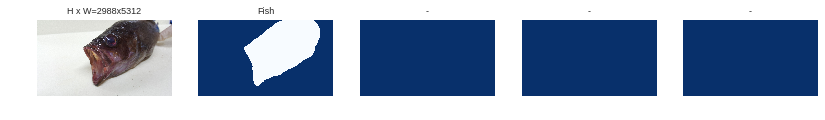

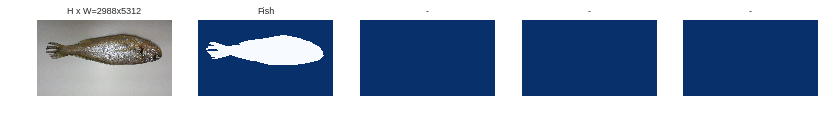

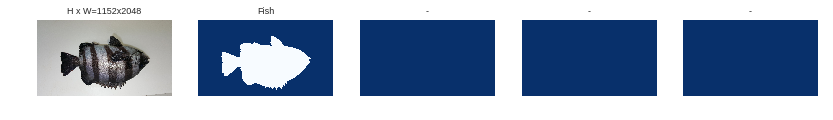

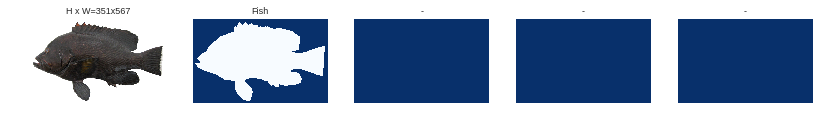

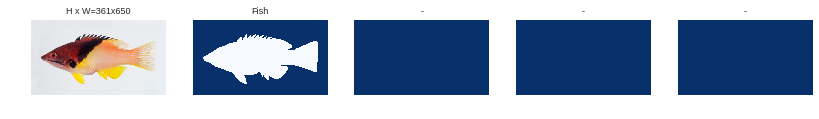

...

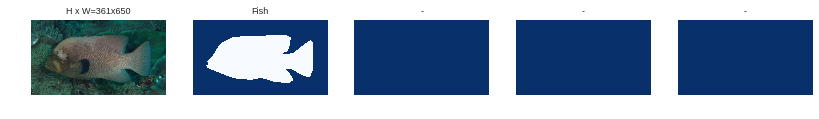

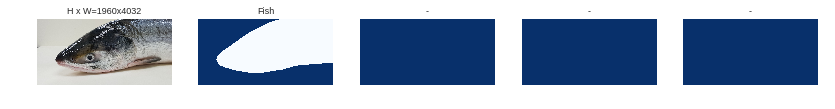

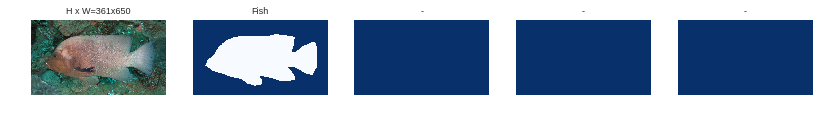

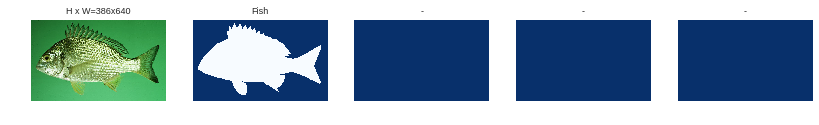

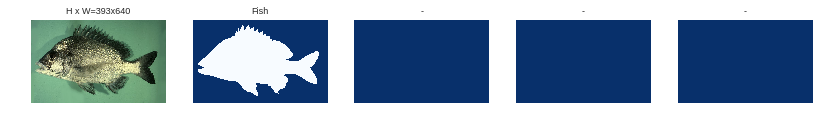

In [0]:
for i in range(196):
    image_id = i
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names)
    mask.shape

In [0]:
if debugging:
    for image_id in dataset.image_ids:
        print("image_id: ", image_id)
        image = dataset.load_image(image_id)
        mask, class_ids = dataset.load_mask(image_id)
        visualize.display_top_masks(image, mask, class_ids, dataset.class_names)
        mask.shape

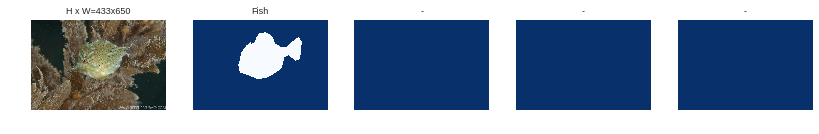

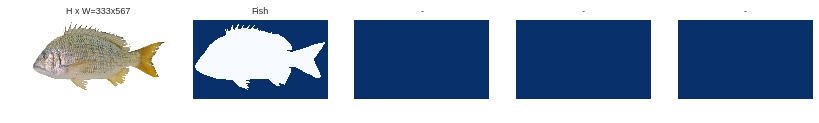

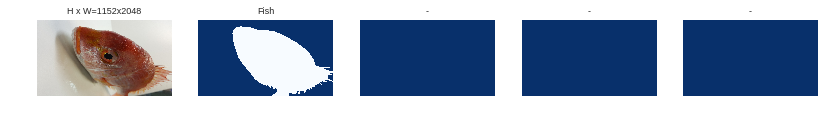

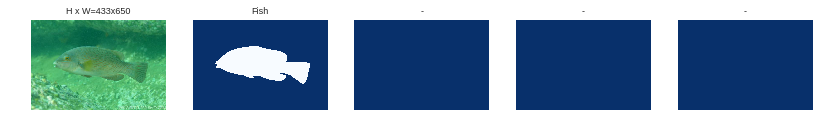

In [0]:
from mrcnn import visualize
from mrcnn.visualize import display_images

# Load and display random samples
image_ids = np.random.choice(dataset_train.image_ids, 4)
for image_id in image_ids:
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names)

## Bounding boxes

Display sample bounding boxes

image_id  42 /content/gdrive/My Drive/Mask_RCNN-master/fish_project/images/fish/train/acanthopagrus_berda_3.jpg
image                    shape: (432, 640, 3)         min:    0.00000  max:  255.00000  uint8
mask                     shape: (432, 640, 1)         min:    0.00000  max:    1.00000  bool
class_ids                shape: (1,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (1, 4)                min:   81.00000  max:  604.00000  int32


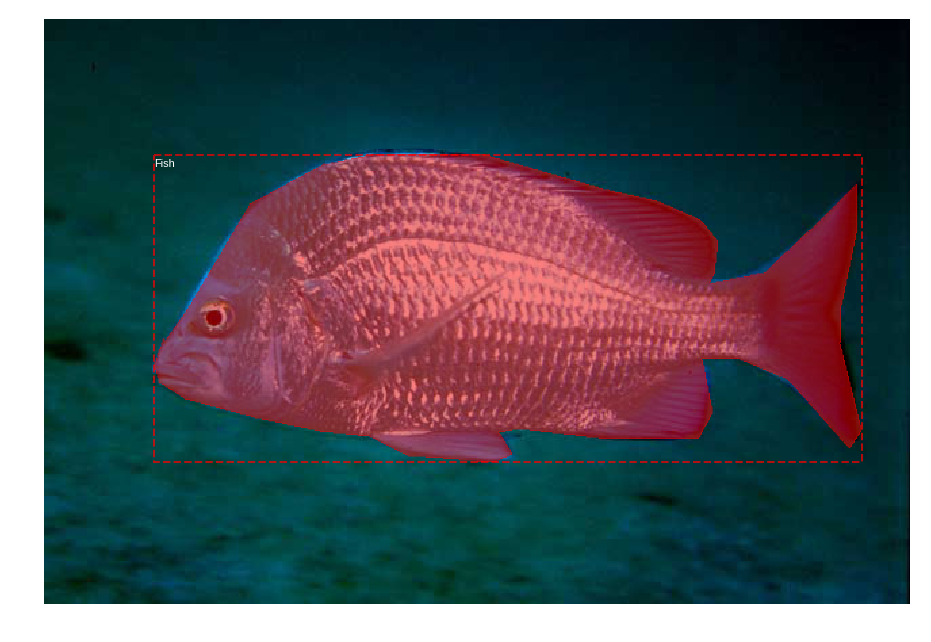

In [0]:
# Load random image and mask.
image_id = random.choice(dataset_train.image_ids)

image = dataset_train.load_image(image_id)
mask, class_ids = dataset_train.load_mask(image_id)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

type(mask)

# Display image and additional stats
print("image_id ", image_id, dataset_train.image_reference(image_id))
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset_train.class_names)

## Prepare images

Images are resized to a common size of 1024x1024. Aspect ration is preserved. If an image is not square, then zero padding is added.

image_id:  101 /content/gdrive/My Drive/Mask_RCNN-master/fish_project/images/fish/train/achoerodus_gouldii_2.jpg
Original shape:  (431, 650, 3)
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
mask                     shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  bool
class_ids                shape: (1,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (1, 4)                min:  159.00000  max:  889.00000  int32


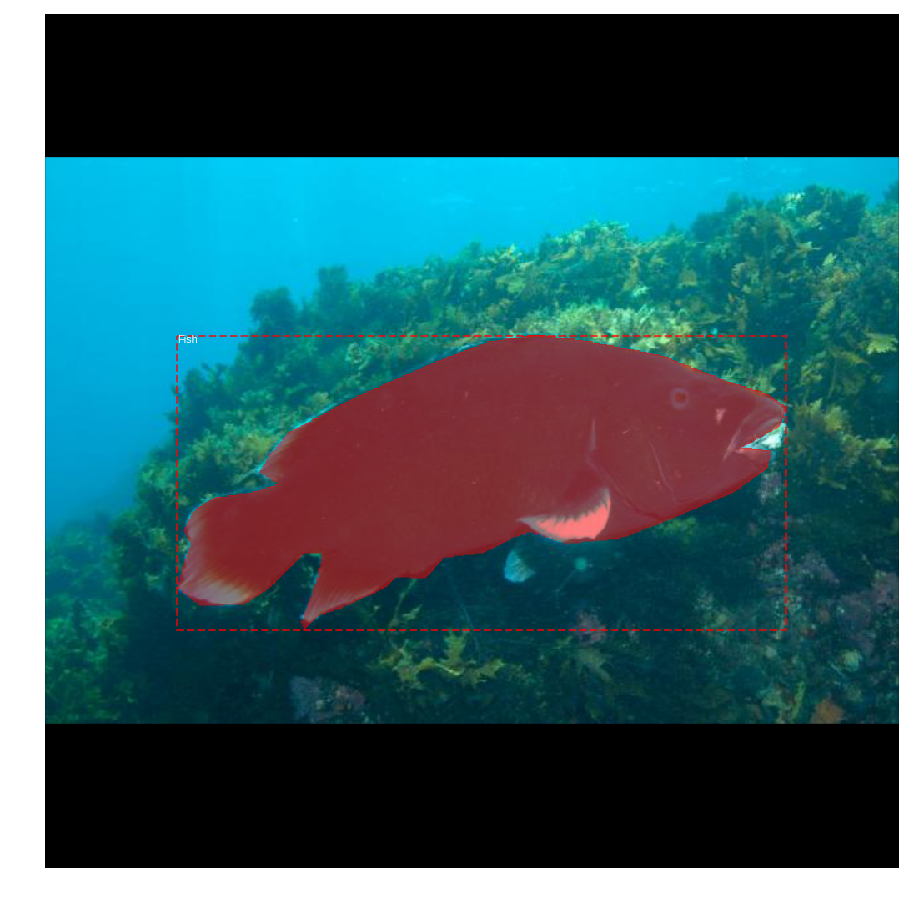

In [0]:
# Load random image and mask.
image_id = np.random.choice(dataset_train.image_ids, 1)[0]
image = dataset_train.load_image(image_id)
mask, class_ids = dataset_train.load_mask(image_id)
original_shape = image.shape
# Resize
image, window, scale, padding, _ = utils.resize_image(
    image, 
    min_dim=config.IMAGE_MIN_DIM, 
    max_dim=config.IMAGE_MAX_DIM,
    mode=config.IMAGE_RESIZE_MODE)
mask = utils.resize_mask(mask, scale, padding)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id: ", image_id, dataset_train.image_reference(image_id))
print("Original shape: ", original_shape)
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset_train.class_names)

## Mini Masks

Instance binary masks can get large when training with high resolution images. For example, if training with 1024x1024 image then the mask of a single instance requires 1MB of memory (Numpy uses bytes for boolean values). If an image has 100 instances then that's 100MB for the masks alone. 

To improve training speed, we optimize masks by:
* We store mask pixels that are inside the object bounding box, rather than a mask of the full image. Most objects are small compared to the image size, so we save space by not storing a lot of zeros around the object.
* We resize the mask to a smaller size (e.g. 56x56). For objects that are larger than the selected size we lose a bit of accuracy. But most object annotations are not very accurate to begin with, so this loss is negligable for most practical purposes. Thie size of the mini_mask can be set in the config class.

To visualize the effect of mask resizing, and to verify the code correctness, we visualize some examples.

image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
image_meta               shape: (14,)                 min:    0.00000  max: 1024.00000  float64
class_ids                shape: (1,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (1, 4)                min:  268.00000  max:  797.00000  int32
mask                     shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  bool


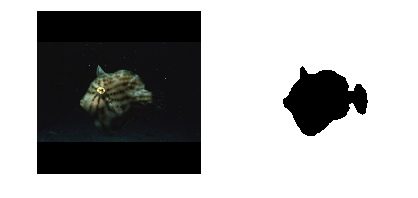

In [0]:
image_id = np.random.choice(dataset_train.image_ids, 1)[0]
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset_train, config, image_id, use_mini_mask=False)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

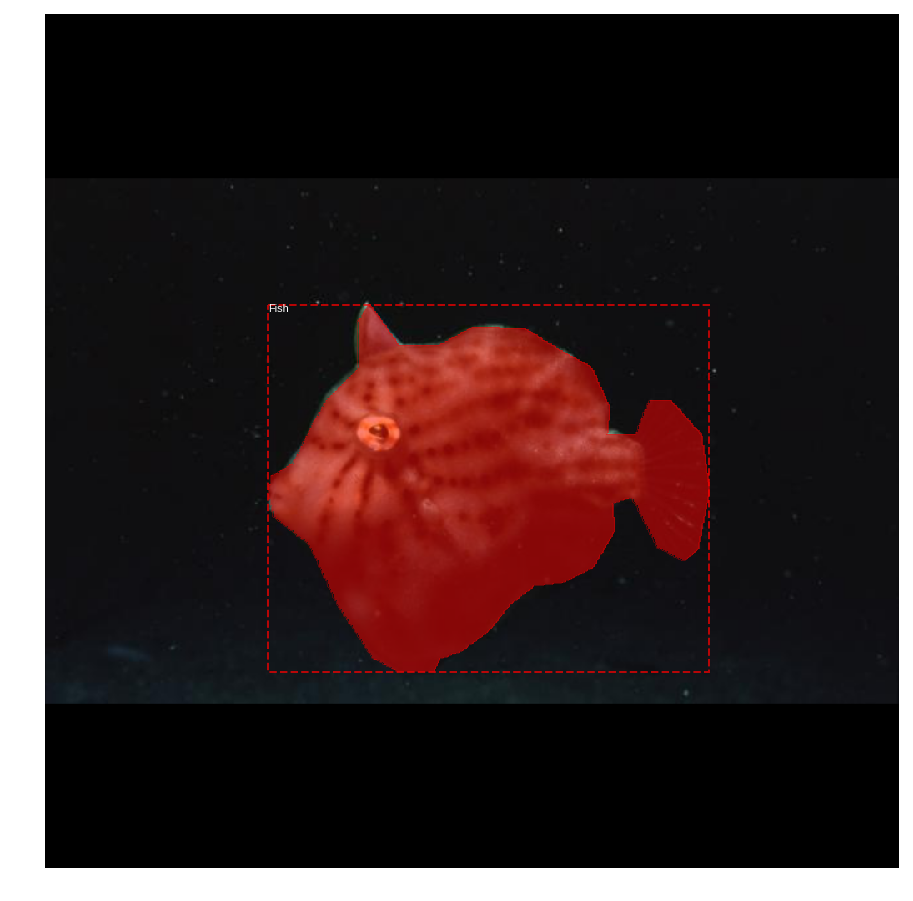

In [0]:
visualize.display_instances(image, bbox, mask, class_ids, dataset_train.class_names)

## Augmentation

In [0]:
# The imgaug library is pretty flexible and make different types of augmentation possible. 
# The deterministic setting is used because any spatial changes to the image must also be 
# done to the mask. There are also some augmentors that are unsafe to apply. From the mrcnn
# library: 
# Augmentors that are safe to apply to masks: 
# ["Sequential", "SomeOf", "OneOf", "Sometimes","Fliplr", 
# "Flipud", "CropAndPad", "Affine", "PiecewiseAffine"]
# Affine, has settings that are unsafe, so always
# test your augmentation on masks

import imgaug as ia
from imgaug import augmenters as iaa

ia.seed(1)

# http://imgaug.readthedocs.io/en/latest/source/augmenters.html#sequential
seq_of_aug = iaa.Sequential([
    iaa.Crop(percent=(0, 0.1)), # random crops
    
    # horizontally flip 50% of the images
    iaa.Fliplr(0.5), 

    # Gaussian blur to 50% of the images
    # with random sigma between 0 and 0.5.
    iaa.Sometimes(0.5,
        iaa.GaussianBlur(sigma=(0, 0.5))
    ),
    
    # Strengthen or weaken the contrast in each image.
    iaa.ContrastNormalization((0.75, 1.5)),
    
    # Add gaussian noise.
    # For 50% of all images, we sample the noise once per pixel.
    # For the other 50% of all images, we sample the noise per pixel AND
    # channel. This can change the color (not only brightness) of the
    # pixels.
    iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5),
    
    # Make some images brighter and some darker.
    # In 20% of all cases, we sample the multiplier once per channel,
    # which can end up changing the color of the images.
    iaa.Multiply((0.8, 1.2), per_channel=0.2),
    
    # Apply affine transformations to each image.
    # Scale/zoom them from 90% 5o 110%
    # Translate/move them, rotate them
    # Shear them slightly -2 to 2 degrees.
    iaa.Affine(
        scale={"x": (0.9, 1.1), "y": (0.9, 1.1)},
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
        rotate=(-5, 5),
        shear=(-2, 2)
    )
], random_order=True) # apply augmenters in random order


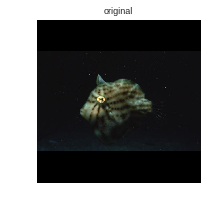

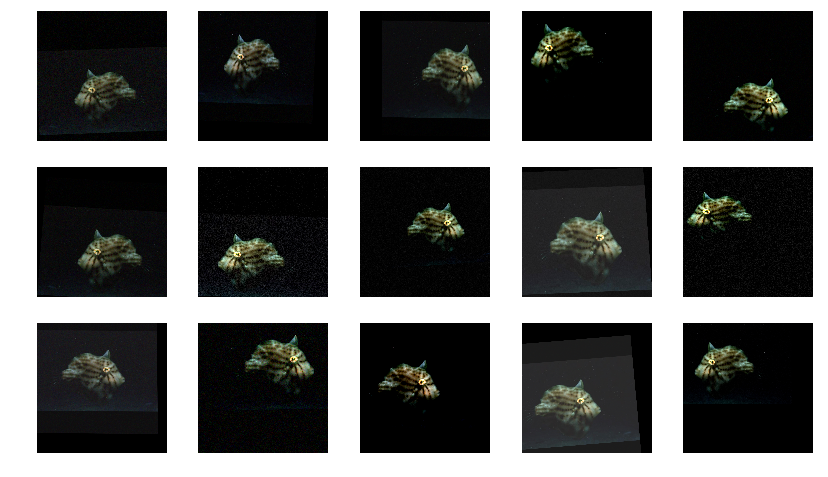

In [0]:
# Some example augmentations using the seq defined above.
display_images( [image], titles=['original'])

image_list = []
for i in range(15):
    image_aug = seq_of_aug.augment_image(image)
    image_list.append( image_aug)
    
display_images(image_list, cols=5)

mask                     shape: (56, 56, 1)           min:    0.00000  max:    1.00000  bool


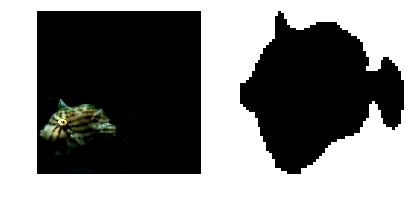

In [0]:
# Add augmentation and mask resizing.
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset_train, config, image_id, augmentation=seq_of_aug, use_mini_mask=True)
log("mask", mask)
display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

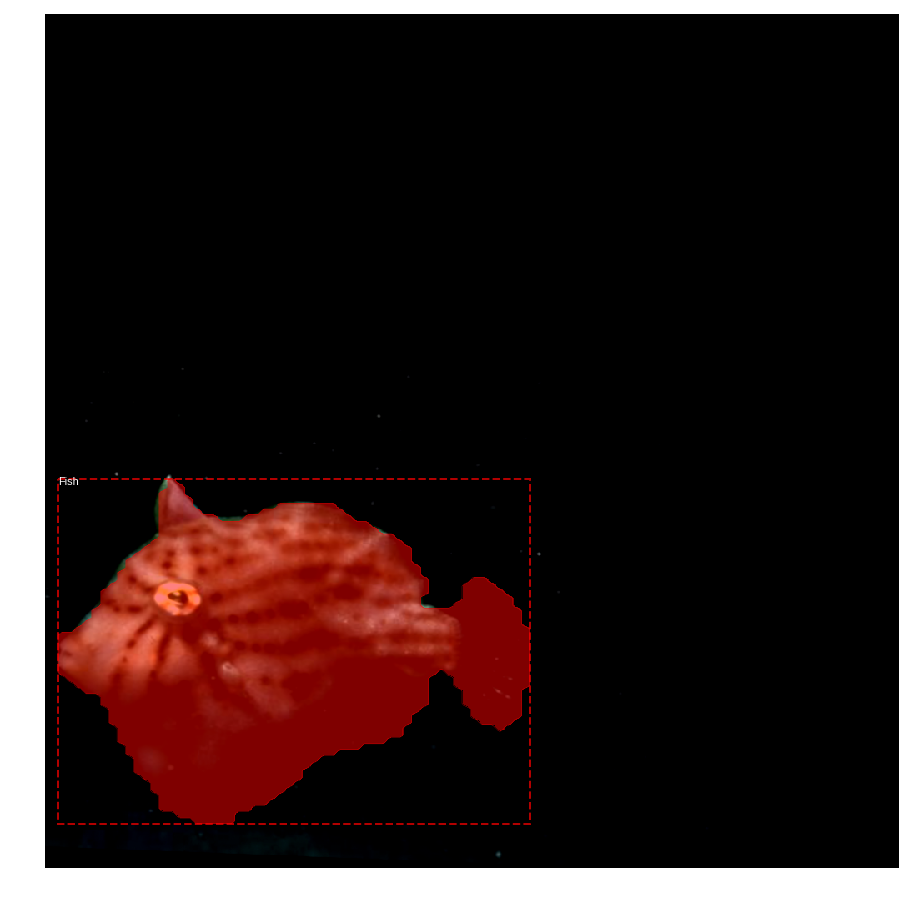

In [0]:
mask = utils.expand_mask(bbox, mask, image.shape)
visualize.display_instances(image, bbox, mask, class_ids, dataset_train.class_names)

## Anchor Boxes

The order of anchor boxes is important. Use the same order in training and prediction phases. And it must match the order of the convolution execution.

For an FPN network, the anchors must be ordered in a way that makes it easy to match anchors to the output of the convolution layers that predict anchor scores and shifts. 
* Sort by pyramid level first. All anchors of the first level, then all of the second and so on. This makes it easier to separate anchors by level.
* Within each level, sort anchors by feature map processing sequence. Typically, a convolution layer processes a feature map starting from top-left and moving right row by row. 
* For each feature map cell, pick any sorting order for the anchors of different ratios. Here we match the order of ratios passed to the function.

**Anchor Stride:**
In the FPN architecture, feature maps at the first few layers are high resolution. For example, if the input image is 1024x1024 then the feature meap of the first layer is 256x256, which generates about 200K anchors (256*256*3). These anchors are 32x32 pixels and their stride relative to image pixels is 4 pixels, so there is a lot of overlap. We can reduce the load significantly if we generate anchors for every other cell in the feature map. A stride of 2 will cut the number of anchors by 4, for example. 

In this implementation we use an anchor stride of 2, which is different from the paper.

In [0]:
# Generate Anchors
backbone_shapes = modellib.compute_backbone_shapes(config, config.IMAGE_SHAPE)
anchors = utils.generate_pyramid_anchors(config.RPN_ANCHOR_SCALES, 
                                          config.RPN_ANCHOR_RATIOS,
                                          backbone_shapes,
                                          config.BACKBONE_STRIDES, 
                                          config.RPN_ANCHOR_STRIDE)

# Print summary of anchors
num_levels = len(backbone_shapes)
anchors_per_cell = len(config.RPN_ANCHOR_RATIOS)
print("Count: ", anchors.shape[0])
print("Scales: ", config.RPN_ANCHOR_SCALES)
print("ratios: ", config.RPN_ANCHOR_RATIOS)
print("Anchors per Cell: ", anchors_per_cell)
print("Levels: ", num_levels)
anchors_per_level = []
for l in range(num_levels):
    num_cells = backbone_shapes[l][0] * backbone_shapes[l][1]
    anchors_per_level.append(anchors_per_cell * num_cells // config.RPN_ANCHOR_STRIDE**2)
    print("Anchors in Level {}: {}".format(l, anchors_per_level[l]))

Count:  261888
Scales:  (32, 64, 128, 256, 512)
ratios:  [0.5, 1, 2]
Anchors per Cell:  3
Levels:  5
Anchors in Level 0: 196608
Anchors in Level 1: 49152
Anchors in Level 2: 12288
Anchors in Level 3: 3072
Anchors in Level 4: 768


Visualize anchors of one cell at the center of the feature map of a specific level.

Level 0. Anchors: 196608  Feature map Shape: [256 256]
Level 1. Anchors:  49152  Feature map Shape: [128 128]
Level 2. Anchors:  12288  Feature map Shape: [64 64]
Level 3. Anchors:   3072  Feature map Shape: [32 32]
Level 4. Anchors:    768  Feature map Shape: [16 16]


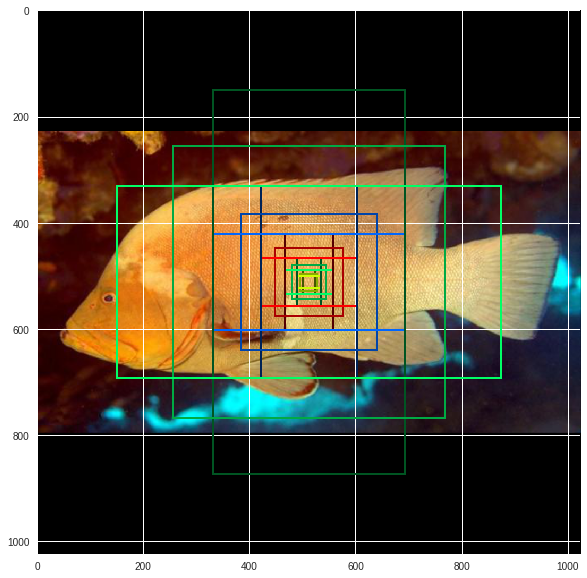

In [0]:
## Visualize anchors of one cell at the center of the feature map of a specific level



# Load and draw random image
image_id = np.random.choice(dataset_train.image_ids, 1)[0]
image, image_meta, _, _, _ = modellib.load_image_gt(dataset_train, config, image_id)
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(image)
levels = len(backbone_shapes)

for level in range(levels):
    colors = visualize.random_colors(levels)
    # Compute the index of the anchors at the center of the image
    level_start = sum(anchors_per_level[:level]) # sum of anchors of previous levels
    level_anchors = anchors[level_start:level_start+anchors_per_level[level]]
    print("Level {}. Anchors: {:6}  Feature map Shape: {}".format(level, level_anchors.shape[0], 
                                                                  backbone_shapes[level]))
    center_cell = backbone_shapes[level] // 2
    center_cell_index = (center_cell[0] * backbone_shapes[level][1] + center_cell[1])
    level_center = center_cell_index * anchors_per_cell 
    center_anchor = anchors_per_cell * (
        (center_cell[0] * backbone_shapes[level][1] / config.RPN_ANCHOR_STRIDE**2) \
        + center_cell[1] / config.RPN_ANCHOR_STRIDE)
    level_center = int(center_anchor)

    # Draw anchors. Brightness show the order in the array, dark to bright.
    for i, rect in enumerate(level_anchors[level_center:level_center+anchors_per_cell]):
        y1, x1, y2, x2 = rect
        p = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, facecolor='none',
                              edgecolor=(i+1)*np.array(colors[level]) / anchors_per_cell)
        ax.add_patch(p)


# Data Generator

In [0]:
# Create data generator
random_rois = 2000
g = modellib.data_generator(
    dataset_train, config, shuffle=True, random_rois=random_rois, 
    batch_size=4,
    detection_targets=True,
    augmentation=seq_of_aug
    )

For debugging...

Run the generator through a set of images to catch any errors. I've seen the following:

* Points in `all_points_x` extending beyond the width
* Points in `all_points_y` extending beyond the height
* `all_points_x` or `all_points_y` somethimes not written correctly.
* If the order changes between the fs and annotation files is not the same there can be an error thrown that looks like the above.



In [0]:
if debugging:
    # Run the generator through a lot of images
    for i in range(10):
        print(i)
        _, _ = next(g)
        

In [0]:
# Get Next Image
if random_rois:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_class_ids, gt_boxes, gt_masks, rpn_rois, rois], \
    [mrcnn_class_ids, mrcnn_bbox, mrcnn_mask] = next(g)
    
    log("rois", rois)
    log("mrcnn_class_ids", mrcnn_class_ids)
    log("mrcnn_bbox", mrcnn_bbox)
    log("mrcnn_mask", mrcnn_mask)
else:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_boxes, gt_masks], _ = next(g)
    
log("gt_class_ids", gt_class_ids)
log("gt_boxes", gt_boxes)
log("gt_masks", gt_masks)
log("rpn_match", rpn_match, )
log("rpn_bbox", rpn_bbox)
image_id = modellib.parse_image_meta(image_meta)["image_id"][0]
print("image_id: ", image_id, dataset_train.image_reference(image_id))

# Remove the last dim in mrcnn_class_ids. It's only added
# to satisfy Keras restriction on target shape.
mrcnn_class_ids = mrcnn_class_ids[:,:,0]

rois                     shape: (4, 200, 4)           min:    0.00000  max: 1023.00000  int32
mrcnn_class_ids          shape: (4, 200, 1)           min:    0.00000  max:    1.00000  int32
mrcnn_bbox               shape: (4, 200, 2, 4)        min:   -3.89583  max:    4.23747  float32
mrcnn_mask               shape: (4, 200, 28, 28, 2)   min:    0.00000  max:    1.00000  float32
gt_class_ids             shape: (4, 100)              min:    0.00000  max:    1.00000  int32
gt_boxes                 shape: (4, 100, 4)           min:    0.00000  max: 1024.00000  int32
gt_masks                 shape: (4, 56, 56, 100)      min:    0.00000  max:    1.00000  bool
rpn_match                shape: (4, 261888, 1)        min:   -1.00000  max:    1.00000  int32
rpn_bbox                 shape: (4, 256, 4)           min:   -1.62109  max:    3.44727  float64
image_id:  52 /content/gdrive/My Drive/Mask_RCNN-master/fish_project/images/fish/train/20170424_183235.jpg


anchors                  shape: (261888, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (1, 4)                min:  232.99997  max:  819.00000  float32
Positive anchors: 1
Negative anchors: 255
Neutral anchors: 261632
BG                     : 143
Fish                   : 57


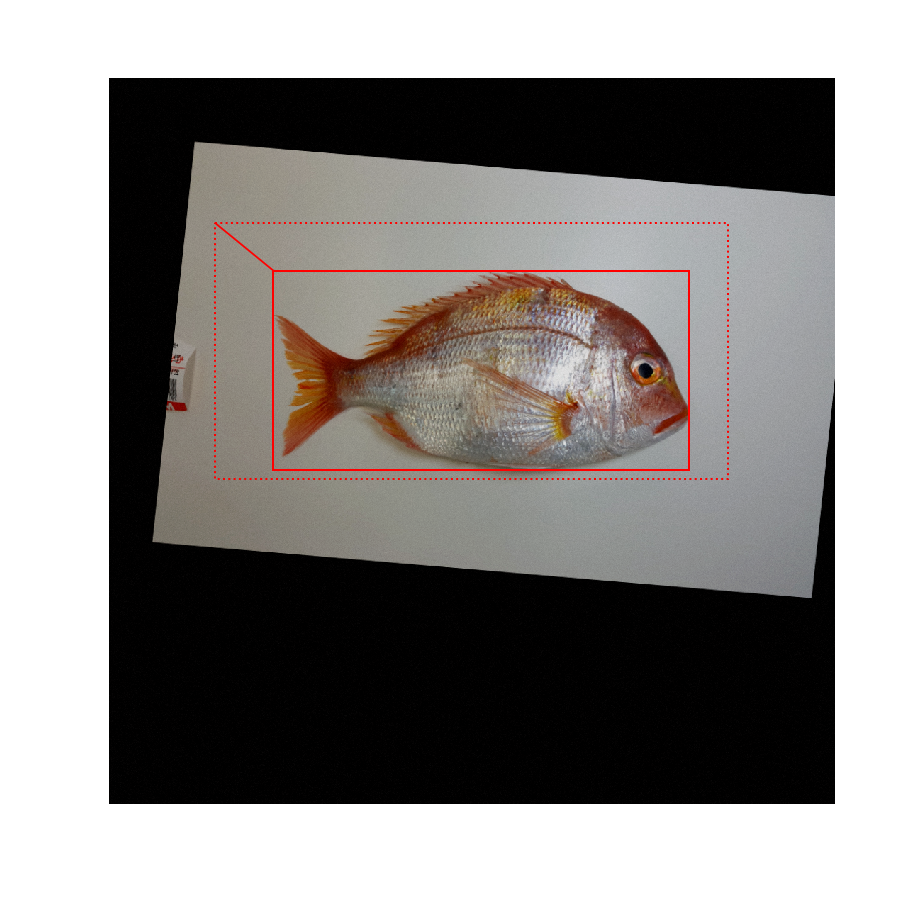

In [0]:
b = 0

# Restore original image (reverse normalization)
sample_image = modellib.unmold_image(normalized_images[b], config)

# Compute anchor shifts.
indices = np.where(rpn_match[b] == 1)[0]
refined_anchors = utils.apply_box_deltas(anchors[indices], rpn_bbox[b, :len(indices)] * config.RPN_BBOX_STD_DEV)
log("anchors", anchors)
log("refined_anchors", refined_anchors)

# Get list of positive anchors
positive_anchor_ids = np.where(rpn_match[b] == 1)[0]
print("Positive anchors: {}".format(len(positive_anchor_ids)))
negative_anchor_ids = np.where(rpn_match[b] == -1)[0]
print("Negative anchors: {}".format(len(negative_anchor_ids)))
neutral_anchor_ids = np.where(rpn_match[b] == 0)[0]
print("Neutral anchors: {}".format(len(neutral_anchor_ids)))

# ROI breakdown by class
for c, n in zip(dataset_train.class_names, np.bincount(mrcnn_class_ids[b].flatten())):
    if n:
        print("{:23}: {}".format(c[:20], n))

# Show positive anchors
fig, ax = plt.subplots(1, figsize=(16, 16))
visualize.draw_boxes(sample_image, boxes=anchors[positive_anchor_ids], 
                     refined_boxes=refined_anchors, ax=ax)

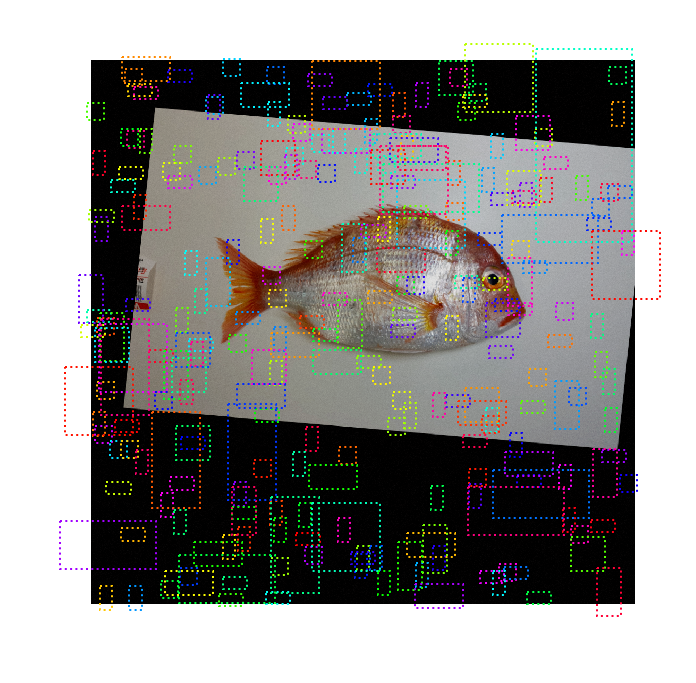

In [0]:
# Show negative anchors
visualize.draw_boxes(sample_image, boxes=anchors[negative_anchor_ids])

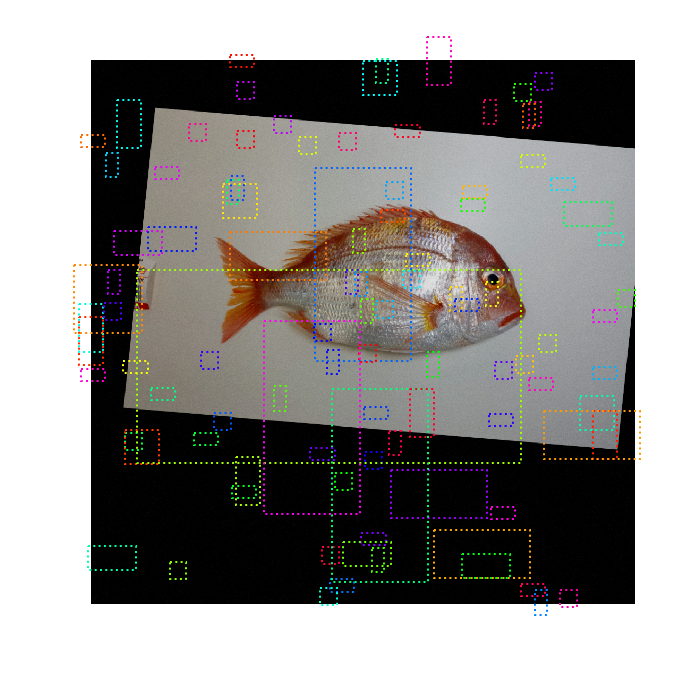

In [0]:
# Show neutral anchors. They don't contribute to training.
visualize.draw_boxes(sample_image, boxes=anchors[np.random.choice(neutral_anchor_ids, 100)])

## Regions of Interest

Positive ROIs:  57
Negative ROIs:  143
Positive Ratio: 0.28
Unique ROIs: 200 out of 200


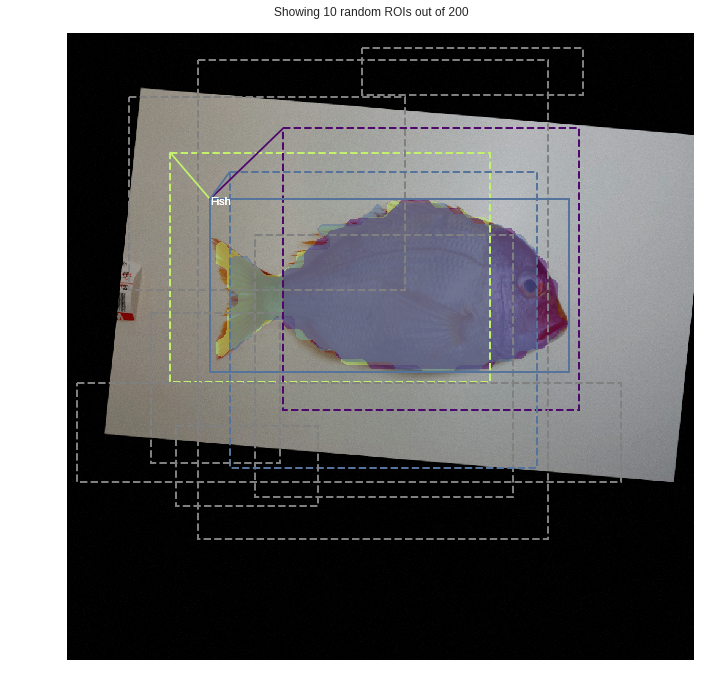

In [0]:
if random_rois:
    # Class aware bboxes
    bbox_specific = mrcnn_bbox[b, np.arange(mrcnn_bbox.shape[1]), mrcnn_class_ids[b], :]

    # Refined ROIs
    refined_rois = utils.apply_box_deltas(rois[b].astype(np.float32), bbox_specific[:,:4] * config.BBOX_STD_DEV)

    # Class aware masks
    mask_specific = mrcnn_mask[b, np.arange(mrcnn_mask.shape[1]), :, :, mrcnn_class_ids[b]]

    visualize.draw_rois(sample_image, rois[b], refined_rois, mask_specific, mrcnn_class_ids[b], dataset_train.class_names)
    
    # Any repeated ROIs?
    rows = np.ascontiguousarray(rois[b]).view(np.dtype((np.void, rois.dtype.itemsize * rois.shape[-1])))
    _, idx = np.unique(rows, return_index=True)
    print("Unique ROIs: {} out of {}".format(len(idx), rois.shape[1]))

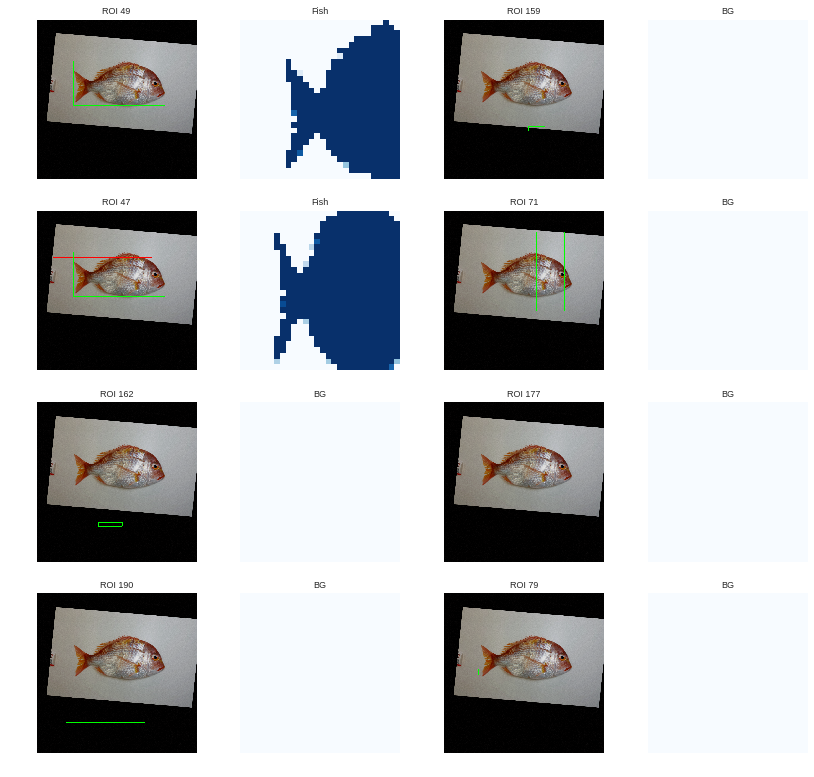

In [0]:
if random_rois:
    # Dispalay ROIs and corresponding masks and bounding boxes
    ids = random.sample(range(rois.shape[1]), 8)

    images = []
    titles = []
    for i in ids:
        image = visualize.draw_box(sample_image.copy(), rois[b,i,:4].astype(np.int32), [255, 0, 0])
        image = visualize.draw_box(image, refined_rois[i].astype(np.int64), [0, 255, 0])
        images.append(image)
        titles.append("ROI {}".format(i))
        images.append(mask_specific[i] * 255)
        titles.append(dataset_train.class_names[mrcnn_class_ids[b,i]][:20])

    display_images(images, titles, cols=4, cmap="Blues", interpolation="none")

In [0]:
# Check ratio of positive ROIs in a set of images.
if random_rois:
    limit = 10
    temp_g = modellib.data_generator(
        dataset_train, config, shuffle=True, random_rois=10000, 
        batch_size=1, detection_targets=True)
    total = 0
    for i in range(limit):
        _, [ids, _, _] = next(temp_g)
        positive_rois = np.sum(ids[0] > 0)
        total += positive_rois
        print("{:5} {:5.2f}".format(positive_rois, positive_rois/ids.shape[1]))
    print("Average percent: {:.2f}".format(total/(limit*ids.shape[1])))

   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
Average percent: 0.33


# Train

The default implementation uses the ResNet101 and FPN networks. These are very large and they recommend a GPU with 12GB or an Amazon P2 instance.


In [0]:
print("dataset dir:", dataset_path)
print("modesl dir:", models_dir)

dataset dir: /content/gdrive/My Drive/Mask_RCNN-master/fish_project/images/fish
modesl dir: /content/gdrive/My Drive/Mask_RCNN-master/fish_project/models/


In [0]:
# Setup configuration
config = det.DetConfig('Fish', ['Fish'])
config.display()


Configurations:
ACTIVATION                     leakyrelu
ALL_CLASS_NAMES                ['BG', 'Fish']
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
CLASS_NAMES                    ['Fish']
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0,

In [0]:
# Create the model
model = modellib.MaskRCNN(mode='training', 
                          config=config,
                          model_dir=models_dir)

model.keras_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        (None, None, None, 3 0                                            
__________________________________________________________________________________________________
zero_padding2d_3 (ZeroPadding2D (None, None, None, 3 0           input_image[0][0]                
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, None, None, 6 9472        zero_padding2d_3[0][0]           
__________________________________________________________________________________________________
bn_conv1 (BatchNorm)            (None, None, None, 6 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

In [0]:
# Load the weights

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(models_dir, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)
else:
    print("using existing ", COCO_MODEL_PATH)
    
# For the coco dataset exclude the last layers because 
# it requires a matching number of classes
print("loading...", end='')
model.load_weights(COCO_MODEL_PATH, by_name=True, exclude=[
    "mrcnn_class_logits", "mrcnn_bbox_fc",
    "mrcnn_bbox", "mrcnn_mask"])

print("loaded.")

using existing  /content/gdrive/My Drive/Mask_RCNN-master/fish_project/models/mask_rcnn_coco.h5
loading...loaded.


In [0]:
def train(model, dataset_path, epochs=30):
    """Train the model."""
    
    # Create the train and val dataset.
    dataset_train, dataset_val = det.create_datasets(dataset_path+'/train', config)

    # Prepare them
    dataset_train.prepare()
    dataset_val.prepare()

    # Experiment with training options.
    # Since we're using a very small dataset, and starting from
    # COCO trained weights, we don't need to train too long. Also,
    # no need to train all layers, just the heads should do it.
    print("Training all network")
    history = model.train(dataset_train, dataset_val,
                learning_rate=config.LEARNING_RATE,
                epochs=epochs,
                layers='head', 
                augmentation=seq_of_aug
                )
    
    return history

In [0]:
history = train(model, dataset_path, 70)

Counter({'Fish': 205})
Counter({'Fish': 51})
Adding class   1:Fish
Adding class   1:Fish
Training all network

Starting at epoch 0. LR=0.001

Checkpoint Path: /content/gdrive/My Drive/Mask_RCNN-master/fish_project/models/fish20190223T1548/mask_rcnn_fish_{epoch:04d}.h5
Selecting layers to train
In model:  rpn_model


ValueError: ignored

In [0]:
import math

def plot_history(history):
    
    fig = plt.figure(figsize=(16,10))
       
    n_history_loss = len(history.history)
    n_epochs = len(history.epoch)
    epoch = history.epoch
    
    # The loss is in pairs, one for train, one for val
    loss_stats = [ k for k in history.history.keys() if 'val_' not in k ]
    
    n_cols = 4
    n_rows = math.ceil(len(loss_stats) / n_cols) 
    
    for i, k in enumerate(loss_stats):
        val_k = 'val_'+k
        ax = plt.subplot( n_rows, n_cols, i+1)
        ax.plot(epoch, history.history[k], label=k)
        ax.plot(epoch, history.history[val_k], label=val_k)
        ax.set_xlabel('Epochs')
        ax.set_ylabel('Loss')
        ax.set_title(str(i)+' - '+k)
        plt.legend(shadow=True, fancybox=True)
    
    fig.tight_layout()
    plt.show()
    
    

In [0]:
# Plot training stats for each of the networks.
plot_history(history)

# Inference

In [0]:
class InferenceConfig(det.DetConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    
inf_config = InferenceConfig('Fish', ['Fish'])
#inf_config = InferenceConfig('Fish', ['choerodon cyanodus','choerodon jordani','choerodon fasciatus','choerodon graphicus'])
inf_model = modellib.MaskRCNN(mode="inference", 
                              config=inf_config,
                              model_dir=models_dir)

inf_config.display()

# Find last trained weights
#weights_path = inf_model.find_last()[1]

# When testing use the latest, for demo use stable model
#weights_path = os.path.join(models_dir+'fish20190216T1728', "mask_rcnn_fish_0030.h5")
weights_path = os.path.join(models_dir+'fish20190217T2122', "mask_rcnn_fish_0070.h5")
# weights_path = os.path.join(models_dir, "wolf20180516T0136_mask_rcnn_wolf_0075.h5")


print("Using latest weights: ", weights_path)

inf_model.load_weights(weights_path, by_name=True)


In [0]:
import glob

def detect_instance(class_names, image_test_dir):
    """
    class_names: list of class names of the dataset
    image_filenames: list of images to analyze
    """

    det_filenames = sorted(glob.glob(image_test_dir+'/*'))

    for f in det_filenames:
        print("Processing image {}".format(f))

        test_img = plt.imread(f)
        print(test_img.shape)

        plt.imshow(test_img)
        # visualize.display_images([test_img])

        # Included in the results from detect are the found:
        # class_ids,their scores and masks.
        results = inf_model.detect([test_img], verbose=1)[0]

        print("Objects detected: ", len(results['class_ids']))

        # Visualize results
        visualize.display_instances(test_img, 
                                    results['rois'], 
                                    results['masks'], 
                                    results['class_ids'], 
                                    class_names, 
                                    results['scores'])

        print(results['class_ids'])

In [0]:
import math

def detect_instances(class_names, image_test_dir):
    """
    class_names: list of class names of the dataset
    image_filenames: list of images to analyze
    """
        
    det_filenames = sorted(glob.glob(image_test_dir+'/*'))

    fig = plt.figure(figsize=(16,10))

    n_cols = 3
    n_rows = math.ceil(len(det_filenames) / n_cols) 
    
    
    for i, f in enumerate(det_filenames):
        
        print("Processing image {}".format(f))
        
        ax = plt.subplot( n_rows, n_cols, i+1)

        test_img = plt.imread(f)

        # Included in the results from detect are the found:
        # class_ids,their scores and masks.
        results = inf_model.detect([test_img], verbose=1)[0]

        print("Objects detected: ", len(results['class_ids']))

        # Visualize results
        visualize.display_instances(test_img, 
                                    results['rois'], 
                                    results['masks'], 
                                    results['class_ids'], 
                                    class_names, 
                                    results['scores'],
                                    ax=ax)

        print(results['class_ids'])

In [0]:
image_test_dir = os.path.join(ROOT_IMAGE_DIR, "test_images/")
image_test_dir

In [0]:
image_test_dir = os.path.join(ROOT_IMAGE_DIR, "test_images/")

if debugging:
    r = detect_instance(inf_config.ALL_CLASS_NAMES, image_test_dir)
else:
    r = detect_instance(inf_config.ALL_CLASS_NAMES, image_test_dir)

![image.png](attachment:image.png)

![image.png](attachment:image.png)


![image.png](attachment:image.png)

![image.png](attachment:image.png)

곰솔이 물고기설

![image.png](attachment:image.png)

범고래, 고래 테스트

![image.png](attachment:image.png)

70 epochs, 학습데이터에 상어 안넣었는데 상어모양 추출

![image.png](attachment:image.png)
새로 학습시켜서 60 epochs

![image.png](attachment:image.png)

새롭게 학습시켜서 70epochs

![image.png](attachment:image.png)

![image.png](attachment:image.png)
새롭게 학습시키고 50 epochs

In [0]:
class InferenceConfig(det.DetConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    
inf_config = InferenceConfig('Fish', ['Fish'])

_, dataset_val = det.create_datasets(dataset_path+'/train', inf_config)
dataset_val.prepare()

In [0]:
# Compute VOC-Style mAP @ IoU=0.5

# Run on a subset.
#n_image_ids = max(20, len(dataset_val.image_ids))
#image_ids = np.random.choice(dataset_val.image_ids, n_image_ids)
image_ids = dataset_val.image_ids
APs = []



In [0]:
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_val, inf_config,
                               image_id, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, inf_config), 0)
    # Run object detection
    results = inf_model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    print(image_id, AP)
    APs.append(AP)
    
print("mAP: {:.4f}".format(np.mean(APs)))

In [0]:
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_val, inf_config, 18, use_mini_mask=False)

In [0]:
plt.imshow(image)

In [0]:
# Included in the results from detect are the found:
# class_ids,their scores and masks.
results = inf_model.detect([image], verbose=1)[0]

print("Objects detected: ", len(results['class_ids']))

# Visualize results
visualize.display_instances(image, 
                            results['rois'], 
                            results['masks'], 
                            results['class_ids'], 
                            inf_config.ALL_CLASS_NAMES, 
                            results['scores'])

# Extract mask results

In [0]:
## 추출할 사진들 경로 설정
image_dir = os.path.join(ROOT_IMAGE_DIR, "raw_images")
print("image directory : ", image_dir)

image directory :  /content/gdrive/My Drive/Mask_RCNN/csci_e89_project/images/raw_images


In [0]:
import glob
det_filenames = sorted(glob.glob(image_dir+'/*'))

In [0]:
 import re
from collections import defaultdict
result_masks = defaultdict()

for image_name in det_filenames:
    image = skimage.io.imread(image_name)
    if image.ndim != 3:
        image = skimage.color.gray2rgb(image)
    results = inf_model.detect([image], verbose=0)
    print(image_name)
    a = re.split('[/]+', image_name)
    filenames = a.pop()
    ## make dictionary to save results of masks
    result_masks[filenames] = results[0]['masks']

In [0]:
import pickle 

file=open("result_masks_2","wb") 
pickle.dump(result_masks, file) 
file.close()


NameError: ignored

In [0]:
import pickle 
file=open("result_masks_1","rb") 
result_masks=pickle.load(file) 
file.close() 

In [0]:
import re
class_ids = set()
for key in result_masks.keys():
 
    if key:
        
        ## 파일명을 class ID로 사용하기 위해서 정규식으로 잘라냄
        parse = re.sub('[0-9.]', '', key)
        parse1 = re.sub('jpg$|jpeg$', '', parse)
        parse2 = re.sub('_', ' ', count=1, string=parse1)
        parse3 = re.sub('_', '', parse2)
        class_ids.add(parse3)

        
        
        
config_id = list(class_ids)
config_id

['epinephelus coioides',
 'suezichthys arquatus',
 'epinephelus bleekeri',
 'oxycheilinus celebicus',
 'hemiramphus far',
 'evistias acutirostris',
 'pardachirus pavoninus',
 'halichoeres biocellatus',
 'pseudanthias huchtii',
 'halichoeres melanochir',
 'soleichthys heterorhinos',
 'thalassoma nigrofasciatum',
 'anampses femininus',
 'variola albimarginata',
 'pseudorhombus argus',
 'seriolina nigrofasciata',
 'thryssa baelama',
 'pseudocaranx dentex',
 'coris pictoides',
 'lutjanus fulvus',
 'epinephelus howlandi',
 'cirrhilabrus laboutei',
 'carangoides plagiotaenia',
 'epinephelus polyphekadion',
 'lethrinus miniatus',
 'cheilodactylus ephippium',
 'oedalechilus labiosus',
 'lethrinus erythracanthus',
 'oxycheilinus bimaculatus',
 'pteragogus cryptus',
 'stegostoma fasciatum',
 'cheilodactylus spectabilis',
 'plectropomus maculatus',
 'notolabrus tetricus',
 'lethrinus microdon',
 'lutjanus bohar',
 'elagatis bipinnulata',
 'etelis carbunculus',
 'epinephelus lanceolatus',
 'lethri

In [0]:
len(config_id)

483

In [0]:
config = det.DetConfig('fish', config_id)
config.display()


Configurations:
ACTIVATION                     leakyrelu
ALL_CLASS_NAMES                ['BG', 'epinephelus coioides', 'suezichthys arquatus', 'epinephelus bleekeri', 'oxycheilinus celebicus', 'hemiramphus far', 'evistias acutirostris', 'pardachirus pavoninus', 'halichoeres biocellatus', 'pseudanthias huchtii', 'halichoeres melanochir', 'soleichthys heterorhinos', 'thalassoma nigrofasciatum', 'anampses femininus', 'variola albimarginata', 'pseudorhombus argus', 'seriolina nigrofasciata', 'thryssa baelama', 'pseudocaranx dentex', 'coris pictoides', 'lutjanus fulvus', 'epinephelus howlandi', 'cirrhilabrus laboutei', 'carangoides plagiotaenia', 'epinephelus polyphekadion', 'lethrinus miniatus', 'cheilodactylus ephippium', 'oedalechilus labiosus', 'lethrinus erythracanthus', 'oxycheilinus bimaculatus', 'pteragogus cryptus', 'stegostoma fasciatum', 'cheilodactylus spectabilis', 'plectropomus maculatus', 'notolabrus tetricus', 'lethrinus microdon', 'lutjanus bohar', 'elagatis bipinnulata', 

In [0]:
config.BATCH_SIZE = 1
config.display()


Configurations:
ACTIVATION                     leakyrelu
ALL_CLASS_NAMES                ['BG', 'epinephelus coioides', 'suezichthys arquatus', 'epinephelus bleekeri', 'oxycheilinus celebicus', 'hemiramphus far', 'evistias acutirostris', 'pardachirus pavoninus', 'halichoeres biocellatus', 'pseudanthias huchtii', 'halichoeres melanochir', 'soleichthys heterorhinos', 'thalassoma nigrofasciatum', 'anampses femininus', 'variola albimarginata', 'pseudorhombus argus', 'seriolina nigrofasciata', 'thryssa baelama', 'pseudocaranx dentex', 'coris pictoides', 'lutjanus fulvus', 'epinephelus howlandi', 'cirrhilabrus laboutei', 'carangoides plagiotaenia', 'epinephelus polyphekadion', 'lethrinus miniatus', 'cheilodactylus ephippium', 'oedalechilus labiosus', 'lethrinus erythracanthus', 'oxycheilinus bimaculatus', 'pteragogus cryptus', 'stegostoma fasciatum', 'cheilodactylus spectabilis', 'plectropomus maculatus', 'notolabrus tetricus', 'lethrinus microdon', 'lutjanus bohar', 'elagatis bipinnulata', 

In [0]:
# Create the model
model = modellib.MaskRCNN(mode='training', 
                          config=config,
                          model_dir=models_dir)

model.keras_model.summary()

Instructions for updating:
Colocations handled automatically by placer.
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        (None, None, None, 3 0                                            
__________________________________________________________________________________________________
zero_padding2d_1 (ZeroPadding2D (None, None, None, 3 0           input_image[0][0]                
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, None, None, 6 9472        zero_padding2d_1[0][0]           
__________________________________________________________________________________________________
bn_conv1 (BatchNorm)            (None, None, None, 6 256         conv1[0][0]                      
_____________________________________

In [0]:
weights_path = os.path.join(models_dir, "mask_rcnn_coco.h5")
print("loading...", end='')
model.load_weights(weights_path, by_name=True, exclude=[
    "mrcnn_class_logits", "mrcnn_bbox_fc",
    "mrcnn_bbox", "mrcnn_mask"])
print("loaded.")

loading...loaded.


In [0]:
epochs = 75

In [0]:
# Create the train and val dataset.
dataset_train, dataset_val = det.create_datasets_from_result(image_dir, config, result_masks)

# prepare datasets
dataset_train.prepare()
dataset_val.prepare()


Adding class   1:epinephelus coioides
Adding class   2:suezichthys arquatus
Adding class   3:epinephelus bleekeri
Adding class   4:oxycheilinus celebicus
Adding class   5:hemiramphus far
Adding class   6:evistias acutirostris
Adding class   7:pardachirus pavoninus
Adding class   8:halichoeres biocellatus
Adding class   9:pseudanthias huchtii
Adding class  10:halichoeres melanochir
Adding class  11:soleichthys heterorhinos
Adding class  12:thalassoma nigrofasciatum
Adding class  13:anampses femininus
Adding class  14:variola albimarginata
Adding class  15:pseudorhombus argus
Adding class  16:seriolina nigrofasciata
Adding class  17:thryssa baelama
Adding class  18:pseudocaranx dentex
Adding class  19:coris pictoides
Adding class  20:lutjanus fulvus
Adding class  21:epinephelus howlandi
Adding class  22:cirrhilabrus laboutei
Adding class  23:carangoides plagiotaenia
Adding class  24:epinephelus polyphekadion
Adding class  25:lethrinus miniatus
Adding class  26:cheilodactylus ephippium
Ad

In [0]:
import imp
imp.reload(det)

<module 'csci_e89_project.det' from '/content/gdrive/My Drive/Mask_RCNN/csci_e89_project/det.py'>

In [0]:
len(dataset_train.image_info)

3247

In [0]:
# Experiment with training options.
# Since we're using a very small dataset, and starting from
# COCO trained weights, we don't need to train too long. Also,
# no need to train all layers, just the heads should do it.
print("Training all network")
history = model.train(dataset_train, dataset_val,
            learning_rate=config.LEARNING_RATE,
            epochs=epochs,
            layers='all', 
            augmentation=seq_of_aug,
            )


Training all network

Starting at epoch 0. LR=0.001

Checkpoint Path: /content/gdrive/My Drive/Mask_RCNN/csci_e89_project/models/fish20190221T1755/mask_rcnn_fish_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (Batc

/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_impl.py:110: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


In [0]:
import math

def plot_history(history):
    
    fig = plt.figure(figsize=(16,10))
       
    n_history_loss = len(history.history)
    n_epochs = len(history.epoch)
    epoch = history.epoch
    
    # The loss is in pairs, one for train, one for val
    loss_stats = [ k for k in history.history.keys() if 'val_' not in k ]
    
    n_cols = 4
    n_rows = math.ceil(len(loss_stats) / n_cols) 
    
    for i, k in enumerate(loss_stats):
        val_k = 'val_'+k
        ax = plt.subplot( n_rows, n_cols, i+1)
        ax.plot(epoch, history.history[k], label=k)
        ax.plot(epoch, history.history[val_k], label=val_k)
        ax.set_xlabel('Epochs')
        ax.set_ylabel('Loss')
        ax.set_title(str(i)+' - '+k)
        plt.legend(shadow=True, fancybox=True)
    
    fig.tight_layout()
    plt.show()
    
    

In [0]:
# Plot training stats for each of the networks.
plot_history(history)

In [0]:
class InferenceConfig(det.DetConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    
inf_config = InferenceConfig('Fish', config_id)
inf_model = modellib.MaskRCNN(mode="inference", 
                              config=inf_config,
                              model_dir=models_dir)

inf_config.display()

# Find last trained weights
#weights_path = inf_model.find_last()[1]

# When testing use the latest, for demo use stable model
#weights_path = os.path.join(models_dir+'fish20190216T1728', "mask_rcnn_fish_0030.h5")
weights_path = os.path.join(models_dir+'fish20190217T0604', "mask_rcnn_fish_0075.h5")
# weights_path = os.path.join(models_dir, "wolf20180516T0136_mask_rcnn_wolf_0075.h5")


print("Using latest weights: ", weights_path)

inf_model.load_weights(weights_path, by_name=True)


In [0]:
r = detect_instance(inf_config.ALL_CLASS_NAMES, image_test_dir)